# Coursework 1: Learning Learning, From Scratch

_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Sanjeev Muralikrishnan, Remy Sabathier & Maria Stamatopoulou__

The total points for this exercise is 100.

Please refer to Moodle submission page for the due date.


## Submission instructions:

Coursework submissions must comprise of a zipped folder. Inside this zip, you should have two things.


1.   This Jupyter notebook, containing your code and written comments.
2.   A "models/" folder, containing your trained model weights.


 In the notebook, cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any way. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#begin_solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated.

Please, do not change `#begin_test ... #end_test` blocks, these blocks are for TAs.

Each exercise must be implemented from scratch. Unless differently specified, only numpy and matplotlib are allowed. The libraries are imported in [the package cell](#packages) and cannot be modified.



**Questions:**

[Question 1](#question1): Linear Fitting (10 points)

[Question 2](#question2): PCA (12 points)

[Question 3](#question3): Linear Classification (18 points)

[Question 4](#question4): Image Denoising (30 points)

[Question 5](#question5): Neural Implicit Representation (30 points)

## Datasets

We will be using several datasets for the coursework: _IRIS_ , _MNIST_ , _CelebA_ , _NoisyOCR_.

_IRIS_ and _MNIST_ datasets will be downloaded directly in the notebook using the `skdataset` library. Keep in mind that you will need to be connected to Internet to be able to download the datasets. If you want to work offline, you are free to save your dataset to npy file locally and load them while offline although this is not officially supported.

_CelebA_ and _NoisyOCR_ are provided separately in a zip file; make sure to unzip it and the unzipped folder is placed in the same directory as the notebook.


**_IRIS_**: The _IRIS_ dataset contains the following features in order: _sepal length_, _sepal width_, _petal length_, _petal width_. Classes names are: __Iris Setosa__ for label **0**, __Iris Versicolour__ for label **1**, and __Iris Virginica__ for label **2**.

**_MNIST_**: _MNIST_ is a dataset composed of images of handwritten digits.

**_CelebA_**: _CelebA_ is a dataset composed of
RGB images of human faces.

**_NoisyOCR_**: _NoisyOCR_ is a dataset composed of
images of noisy OCR scans, along with corresponding clean target images.

The script will generate two subsets for each of the two datasets, a training subset (**X\_dataset** and **Y\_dataset** with **dataset** the name of the dataset) and a test subset (**X\_dataset\_test** and **Y\_dataset\_test**).

We will test correctness of your code on _Hidden_ set.

**Warning:** as _Hidden_ may have different dimensions from _IRIS_ and _MNIST_, hard-coded solutions may not work, thus resulting in lower grades. You need to make sure that your code would work if applied on a different number of samples and a different number of features/pixels.

## Instructions for the other datasets zip file:
**Download Link:** https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip

You can download this zip locally, unzip it and keep the folder in the same directory as your Notebook. There is code provided below to download and unzip it. If you're using Colab, the downloaded content will remain only while the session is active. When you start a new session, you'd have to download it again.

**Google Drive:** For a more permanent solution, you can upload the *unzipped* folder to your own Google Drive, and mount your drive in the notebook. Code is provided below, to mount the drive.

You can use either options, and a variable `drive_mount` is provided to toggle between the two. Set this variable accordingly.

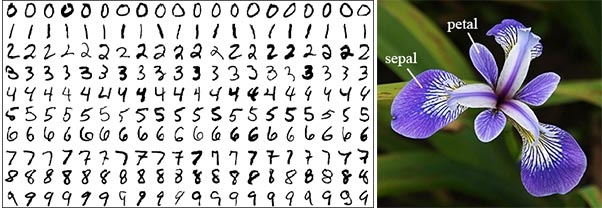

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [150]:
# Importing packages
import numpy as np
import random
import os

import matplotlib.pyplot as plt

from scipy import optimize
from sklearn import datasets as skdataset
from sklearn.model_selection import train_test_split
from pathlib import Path

import os
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.utils.data import Dataset

import imageio
from PIL import Image
import cv2

from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio
from IPython.display import Video

%matplotlib inline

The following code imports the drive module from Colab. This code will only run on Colab. If you're not using Colab, comment this code out, or don't run this cell.

In [151]:
from google.colab import drive

#Unmount any previously mounted drive if needed.
#Feel free to uncomment below line when you need to unmount Drive

#drive.flush_and_unmount()

The following cell sets the `drive_mount` variable. Set it to `True` if your Dataset folder is on drive. If you plan to use the Dataset folder locally, then set this to `False`

In [152]:
drive_mount = False

In [153]:
# Setting the seed
RAND_ST = 42
random.seed(RAND_ST)
#begin_test


#end_test




## Data Loading

The following cells are used to load IRIS and MNIST datasets.

In [154]:
def load_iris_dataset(num_classes=2):
    # Load the datadet from SkDataset
    iris = skdataset.load_iris()
    X = iris.data
    Y = iris.target
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

In [155]:
def load_mnist_dataset(num_classes=2):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

def load_mnist_dataset_onevsall(class_id=7):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # One versus all
    idx = Y == class_id
    Y[~idx] = 0
    Y[idx]  = 1
    return X, Y

## Functions for visualization

In [156]:
def plot_correlation(X1, X2):
    # Plot both variables
    plt.figure(figsize=(8, 6))
    plt.clf()
    plt.scatter(X1, X2, edgecolor='k')
    line = np.linspace(min(X1.min(), X2.min()), max(X1.max(), X2.max()), 20)
    plt.plot(line, line, 'r')
    plt.xlabel('Variable 1')
    plt.ylabel('Variable 2')
    plt.show()

In [157]:
def plot_eigenvecs(stacked_images, n_rows, n_columns, img_shape=None, channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)
        if channels == 1:
            # Normalize eigen vector to [0, 255] range
            eigenvector = stacked_images[i] - np.min(stacked_images[i])
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(np.reshape(eigenvector, [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray')
        elif channels == 3:
            # Normalize eigen vector to [0, 255] range for each channel
            eigenvector = stacked_images[i].reshape(img_shape[0], img_shape[1], 3)
            eigenvector -= np.min(eigenvector)
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(eigenvector)
        plt.axis('off')
    plt.show()

def plot_images(stacked_images, n_rows, n_columns, titles, num_channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)

        if num_channels == 1:
            # Grayscale image
            plt.imshow(np.reshape(stacked_images[i], [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray', vmin=0, vmax=1)
        elif num_channels == 3:
            # RGB image
            image = np.reshape(stacked_images[i], [int(np.sqrt(n_dims // 3)), int(np.sqrt(n_dims // 3)), 3])
            image = np.clip(image, 0, 1)  # Ensure pixel values are within [0, 1] range
            plt.imshow(image)
        else:
            raise ValueError("Unsupported number of channels. Use num_channels=1 for grayscale or num_channels=3 for RGB.")

        plt.axis('off')

        if len(titles) == n_rows * n_columns:
            plt.title(titles[i])

    plt.show()

def plot_images_with_text(images, titles, texts=None):
    N_cols = len(images)
    N_rows = len(images[0])

    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))

    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])

    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()



In [158]:
def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

In [159]:
def true_positive(Y_test, y_pred):
    mask = (Y_test == 1)
    tp = (Y_test[mask] == y_pred[mask]).sum()
    return tp.item()

def true_negative(Y_test, y_pred):
    mask = (Y_test == 0) | (Y_test == -1)
    tn = (Y_test[mask] == y_pred[mask]).sum()
    return tn.item()

def false_negative(Y_test, y_pred):
    mask = (y_pred == 0) | (y_pred == -1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def false_positive(Y_test, y_pred):
    mask = (y_pred == 1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def plot_confusion_matrix(Y_test, y_pred):
    tp = true_positive(Y_test, y_pred)
    tn = true_negative(Y_test, y_pred)
    fp = false_positive(Y_test, y_pred)
    fn = false_negative(Y_test, y_pred)
    cf = np.array([[tn, fp], [fn, tp]])
    fig, ax = plt.subplots()
    ax.matshow(cf, cmap=plt.cm.Blues)
    for i in range(2):
        for j in range(2):
            c = cf[i,j]
            ax.text(j, i, str(c), va='center', ha='center')
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.show()

## Data Loading

In the following cells, the dataset is created with proper splits between training and test set.

_IRIS_ dataset

In [217]:
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

_MNIST_ **dataset**

In [161]:
X, Y = load_mnist_dataset(num_classes=10)
X = X / 255.0
X_mnist, X_mnist_test, Y_mnist, Y_mnist_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


**Code for handling the Dataset zip file**

The following cell mounts your drive if `drive_mount` is `True`

In [163]:
if drive_mount:
  drive.mount('/content/drive')

Set `dataset_path` to Drive or local directory. Also load the CelebA dataset for PCA

In [164]:
if drive_mount:
  dataset_path = '/content/drive/MyDrive/cw_datasets/'
  assert(os.path.exists(dataset_path))
  # Set this path to your appropriate drive path
else:
  dataset_path = "./cw_datasets"
  # In this case, the datasets path is assumed to be in the same directory as this notebook

  if not os.path.exists("./cw_datasets"):
    !wget https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip
    !unzip -q -o cw_datasets.zip

def load_face_images_array(dataset_path="./cw_datasets/",test_fraction=0.05):
  images_path = os.path.join(dataset_path,"face_pca/")
  flattened_images_list = []
  images_paths = [os.path.join(images_path,p) for p in os.listdir(images_path) if p.endswith(".jpg")]
  for image_file in images_paths:
    image_np = np.array(Image.open(image_file))/255.0
    image_np_flattened = np.reshape(image_np,(1,-1))
    flattened_images_list.append(image_np_flattened)
  flattened_images = np.concatenate(flattened_images_list,0)
  split_at = int(len(flattened_images)*test_fraction)
  X_CelebA_test = flattened_images[:split_at]
  X_CelebA = flattened_images[split_at:]
  return X_CelebA, X_CelebA_test

X_CelebA,X_CelebA_test = load_face_images_array(dataset_path)
print(X_CelebA.shape,X_CelebA_test.shape)

(95, 3072) (5, 3072)


## 1. Linear Fitting (10 points)
<a name='question1'></a>

[a)](#question1a) Implement the normal equation solver function **nsolve**, which takes as input the matrix **X** and the target vector **y** and returns the optimized weights **w**. Test your code with your own mockup/randomly created data. (**5 points**)

[b)](#question1b) Implement **line_fit(X,y)** which should fit a linear function to the input data. Test your implementation on the following task: predict with linear fitting the _petal length (cm)_ of the Iris dataset using the three remaining variables as inputs (_sepal length (cm)_, _sepal width (cm)_ and _petal width (cm)_). Report the L2 loss on the validation set and plot a graph showing the correlation between y and your prediction on the test set. (**2 points**)

[c)](#question1c) Implement **poly_fit(X,y)** which should fit a 2nd degree polynomial to the input data. Test your implementation on the following task: predict with the polynomial the petal width (cm) of the _IRIS_ dataset using the three remaining variables as inputs (sepal length (cm), sepal width (cm), petal length (cm)). The 2nd degree polynomial should consider all possible pairwise terms, i.e. $w_1x^2 + w_2xy+ w_3y^2 + w_4x+ w_5y+ w_6$ in the case of two input variables $x$ and $y$. Report the L2 loss on the validation set and plot a graph showing the correlation between $y$ and your prediction on the test set. (**3 points**)

**Question 1a**
<a name='question1a'></a>

Implement the nsolve function

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [167]:
def nsolve(X,y):
    """
    Write your implementation of nsolve here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    """

    #begin_solution
    w = np.linalg.inv(X.T @ X) @ X.T @ y
    #end_solution


    return w

Testing your code on mockup/randomly created data.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [169]:
"""
After implementing nsolve, test it below on some mock data using np.random
"""

#begin_solution
rand_x = np.random.randint(0, 50, size=(10,10))
rand_y = np.random.randint(0, 50, size=10)
print(f"Weights: {nsolve(rand_x,rand_x)}")
#end_solution


Weights: [[ 1.00000000e+00  1.12722331e-13  1.07740206e-13  9.02333763e-14
   1.17104243e-13  1.00558450e-13  8.27012070e-14  1.05145059e-13
   8.48036918e-14  1.26822164e-13]
 [-4.85791962e-14  1.00000000e+00 -5.31623356e-14 -5.07510700e-14
  -6.16954404e-14 -4.63379335e-14 -5.23209948e-14 -5.96502014e-14
  -4.81958223e-14 -6.07326689e-14]
 [-1.25982558e-13 -1.24719679e-13  1.00000000e+00 -1.24178445e-13
  -1.48041301e-13 -1.10189635e-13 -9.87196436e-14 -1.06567533e-13
  -9.34044508e-14 -1.42705292e-13]
 [ 6.41986464e-14  6.47953913e-14  4.96686026e-14  1.00000000e+00
   7.73617281e-14  5.96189764e-14  3.23144289e-14  4.45893322e-14
   3.54646867e-14  7.75074449e-14]
 [ 1.62196645e-15 -9.13245174e-15 -2.77815965e-15 -6.82440215e-15
   1.00000000e+00 -4.40619763e-15 -1.72158295e-14 -1.35698744e-14
  -7.12234091e-15 -1.53705174e-14]
 [ 5.93969318e-15 -1.91513472e-15  2.26207941e-14  1.21014310e-14
  -5.41233725e-16  1.00000000e+00  2.17187379e-14  2.36199948e-14
   1.79162241e-14  3.136

**Question 1b**
<a name='question1b'></a>

Implement the line_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [170]:
def line_fit(X,y):
    """
    Write your implementation of line_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 Prediction error using learned w
    """

    #begin_solution
    w = nsolve(X,y)
    y_predict =  X @ w
    l2_error = np.sum((y_predict - y) ** 2) / len(y)
    #end_solution


    return w, l2_error

Testing your code on _IRIS_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [172]:
"""
After implementing line_fit, test it below on IRIS Train set.
Print the L2 error on the Training set.
"""

#begin_solution
y = X_iris[:, 2]
X = np.delete(X_iris, 2, axis=1)
N = X.shape[0]
x = np.c_[X,np.ones(N)]

w, l2_error = line_fit(x,y)
print(f"Training set error: {l2_error}")
#end_solution


Training set error: 0.09254280323050401


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [174]:
"""
After implementing line_fit, test it below on IRIS Test set.
Print the L2 error with respect to Test set.
"""

#begin_solution
y = X_iris_test[:, 2]
X = np.delete(X_iris_test, 2, axis=1)
N = X.shape[0]
x = np.c_[X,np.ones(N)]


y_predict =  x @ w
l2_error = np.sum((y_predict - y) ** 2) / len(y)
print(f"Test set error: {l2_error}")
#end_solution


Test set error: 0.1624876515733523


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

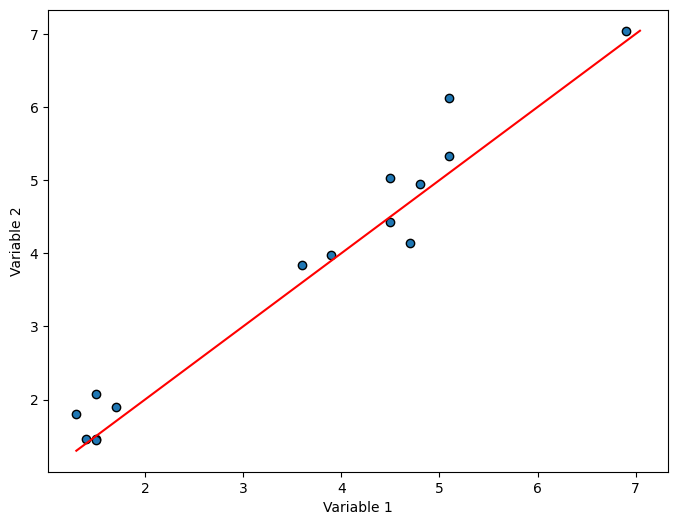

In [175]:
"""
Below, plot and display the correlation between true y and predicted values.
"""
#begin_solution
plot_correlation(y, y_predict)
#end_solution


Do not write anything in the cell below, it is for TAs

In [176]:
#begin_test

#end_test



**Question 1c**
<a name='question1c'></a>

Implement the poly_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
def poly_fit(X,y):
    """
    Write your implementation of poly_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 prediction error using learned w
    """

    #begin_solution
    w = nsolve(X,y)
    y_predict =  X @ w
    l2_error = np.sum((y_predict - y) ** 2)/len(y)
    #end_solution


    return w, l2_error

Testing your code on _IRIS_.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [180]:
"""
After implementing poly_fit, test it below on IRIS Training set.
Print L2 error with respect to training set.
"""

#begin_solution
y = X_iris[:, 3]
X = np.delete(X_iris, 3, axis=1)
N = X.shape[0]

result = []
for i in range(X.shape[1]):
    for j in range(i, X.shape[1]):
        result.append(X[:,i]*X[:,j])
result.append(np.ones(N))
x = np.column_stack(result)


w, l2_error = poly_fit(x,y)
print(f"Training set error: {l2_error}")

#end_solution


Training set error: 0.03787221024371416


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [181]:
"""
After implementing poly_fit, test it below on IRIS Test set.
Print L2 error with respect to test set.
"""

#begin_solution
y = X_iris_test[:, 3]
X = np.delete(X_iris_test, 3, axis=1)
N = X.shape[0]

result = []
for i in range(X.shape[1]):
    for j in range(i, X.shape[1]):
        result.append(X[:,i]*X[:,j])
result.append(np.ones(N))
x = np.column_stack(result)

w, l2_error = poly_fit(x,y)
print(f"L2 Error : {l2_error}")
#end_solution


L2 Error : 0.028381035082867233


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

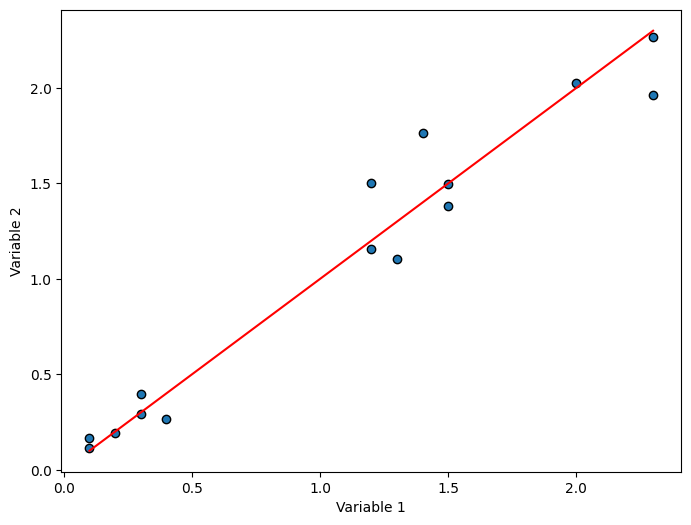

In [182]:
"""
Below, plot and display the correlation between true y and predicted values
"""

#begin_solution
y = X_iris_test[:, 3]
X = np.delete(X_iris_test, 3, axis=1)
N = X.shape[0]

result = []
for i in range(X.shape[1]):
    for j in range(i, X.shape[1]):
        result.append(X[:,i]*X[:,j])
result.append(np.ones(N))
x = np.column_stack(result)


w, l2_error = poly_fit(x,y)
y_predict = x @ w
plot_correlation(y,y_predict)
#end_solution


Do not write anything the cell below, it is for TAs

In [ ]:
#begin_test


#end_test



## 2. PCA (12 points)
<a name='question2'></a>

[a)](#question2a) Implement a function pca(X, ndims) that performs PCA over the input data X and returns both the mean vector  ̄X and the ndims top components. The top components are the eigen vectors linked to the top eigen values computed from the covariance matrix. Try your function on the _MNIST_ dataset (which is composed of 10 digit classes) and on the _CELEBA_ dataset (which contains face RGB images). Display the top 10 components fitted on the train dataset as images.(**2 points** + **2 points** + **2 points**)

[b)](#question2b) Next, check that you can reconstruct perfectly an input image (digit or face) from the test set using all components, by implementing pca_projection(X, mean_vec, eig_vecs) and pca_reconstruction(weights, mean_vec, eig_vecs). (**2 points** + **2 points** + **2 points** on hidden dataset)

**Question 2a**
<a name='question2a'></a>

Implement PCA and plot Eigenvectors

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
def pca(X, ndims, num_image_channels=1):
    """
    Compute PCA on a batch of flattened grayscale or RGB images with dynamic dimensions.

    Arguments:
    X : Data matrix where each row is a flattened image
    ndims : Number of reduced dimensions

    Returns:
    mean_vec : Data mean
    top_eig_vecs : Selected eigen vectors, a matrix where each column corresponds
                    to an eigen vector
    """

    #begin_solution
    # 1. Standardize the data (mean centering)
    mean_vec = np.mean(X, axis=0)
    X_centered = X - mean_vec

    # 2. Calculate the covariance matrix
    cov_matrix = np.cov(X_centered, rowvar=False)

    # 3. Compute the eigenvalues and eigenvectors of the covariance matrix
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)

    # 4. Select the top ndims eigenvectors
    top_eig_vecs = eigenvectors[:, -ndims:]
    #end_solution

    return mean_vec, top_eig_vecs


Testing your code on _MNIST_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

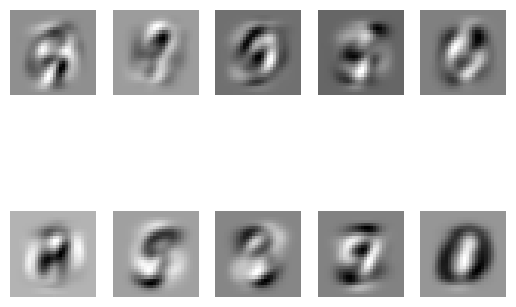

In [ ]:
"""
Below, test your PCA on  MNIST dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution
X_data = X_mnist
mean_vector, main_eig_vectors = pca(X_mnist,ndims=10)
eigen_vecs = main_eig_vectors.T
plot_eigenvecs(eigen_vecs, n_rows=2, n_columns=5,channels=1)
#end_solution


Testing your code on _CelebA_

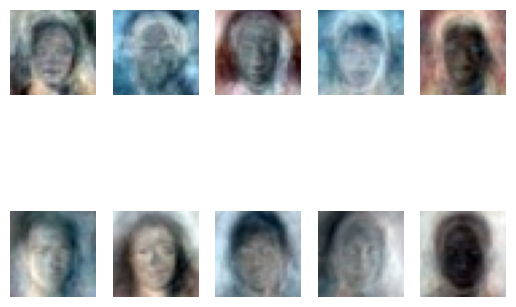

In [ ]:
"""
Below, test your PCA on  CelebA dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution
mean_vector, main_eig_vectors = pca(X_CelebA,ndims=10, num_image_channels=3)
eigen_vecs_img = main_eig_vectors.T
plot_eigenvecs(eigen_vecs_img, n_rows=2, n_columns=5, img_shape=(32,32),channels=3)
#end_solution


Do not write anything in the cell below, it is for the TAs

In [ ]:
#begin_test


#end_test



**Question 2b**

Now, we can evaluate if the code is working properly by projecting the first image of the test set on the eigen vectors.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>


In [183]:
def pca_projection(X, mean_vec, eig_vecs):
    """
    Write your implenetation of PCA projection here.

    Arguments:
    X : Data matrix
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector

    Returns:
    weights : Weights corresponding to the eigen vectors
    """
    #begin_solution
    X_centered = X - mean_vec
    weights = X_centered @ eig_vecs
    #end_solution


    return weights

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [184]:
def pca_reconstruction(weights, mean_vec, eig_vecs):
    """
    Write your implementation of PCA reconstruction here.

    Arguments:
    weights : Weights obtained from pca_projection
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector
    """

    #begin_solution
    reconstruction = (weights @ eig_vecs.T) + mean_vec
    #end_solution


    return reconstruction

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

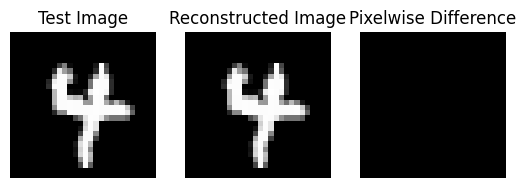

In [194]:
"""
Below,
1. Perform  PCA on MNIST training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution
# Assuming typo: Projection was meant to be Reconstructed
mean_v, eig_v = pca(X_mnist,ndims=X_mnist.shape[1])
weights = pca_projection(X_mnist_test[1], mean_v, eig_v)
reconstructed = pca_reconstruction(weights, mean_v, eig_v)
titles = ["Test Image", "Reconstructed Image", "Pixelwise Difference"]
img_comparison = np.array([X_mnist_test[1], reconstructed, X_mnist_test[1] - reconstructed])
plot_images(img_comparison, n_rows=1, n_columns=3, titles=titles, num_channels=1)
#end_solution


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

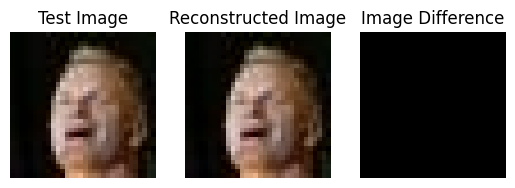

In [196]:
"""
Below,
1. Perform  PCA on CelebA training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution
# Assuming typo: Projection was meant to be Reconstructed
mean_v, eig_v = pca(X_CelebA,ndims=X_CelebA.shape[1])
weights = pca_projection(X_CelebA_test[1], mean_v, eig_v)
reconstructed = pca_reconstruction(weights, mean_v, eig_v)
img_titles = ["Test Image", "Reconstructed Image", "Image Difference"]
img_comparison = np.array([X_CelebA_test[1], reconstructed, X_CelebA_test[1] - reconstructed])
plot_images(img_comparison, n_rows=1, n_columns=3, titles=img_titles, num_channels=3)
#end_solution


#### If your PCA reconstruction for faces is imperfect, discuss why that is the case. Edit the cell below with "Your reply" ####

_Your reply here:_

Don't write anything in the block below, its for TAs

In [ ]:
#begin_test


#end_test



## 3. Linear Classification (18 points)
<a name='question3'></a>

[a)](#question3a) Implement the normal equation-based binary linear classifier lclass(examplesA, examplesB, testExamples) where the first two arguments are the set of samples from class A and class B respectively and the third is the test. The function should return a vector of 0s and 1s, 0 if test is in A and 1 otherwise. It should, for simplicity, both train and test in one function call. (**3 points**)
Test this on all the samples in _IRIS_, Setosa vs non-Setosa, and plot the confusion matrix. (**4 points** on hidden dataset)

[b)](#question3b) Extend the implementation in 3a to do multi-class classification. Implement lclass_prob(examplesA, examplesB, testExamples) and lmclass(examples, class, testExamples) that together perform multi-class classification of the examples examples according to the vector of labels class of the same size and test it with testExamples by returning a matrix, where each row expresses the probability of a sample in testExamples to belong to each class. Give the accuracy of your model. (**5 points** + **6 points** on hidden dataset)

Present findings applying multi-class classification on _IRIS_ dataset with 3 classes.

**Question 3a**
<a name='question3a'></a>

Implement Linear, binary classifier and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [208]:
def lclass(examplesA, examplesB, testExample):
    """
    Write your implementation of normal equation based linear classifier here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted 0/1 labels on testExample
    """

    #begin_solution
    x = np.vstack((examplesA,examplesB))
    x = np.c_[np.ones(x.shape[0]),x]
    y = np.concatenate((np.zeros(len(examplesA)), np.ones(len(examplesB))))
    theta = nsolve(x,y)
    # Make predictions on test
    testExample = np.c_[np.ones(testExample.shape[0]), testExample]

    preds = (testExample @ theta)
    preds = np.where(preds <= 0.5, 0, 1)
    #end_solution


    return preds

_IRIS_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [209]:
"""
After implementing lclass, test it below on the IRIS dataset.
"""

#begin_solution
index = Y_iris == 0
class_A = X_iris[index]
class_B = X_iris[~index]
predicted_vals = lclass(class_A,class_B,X_iris_test)
#end_solution


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

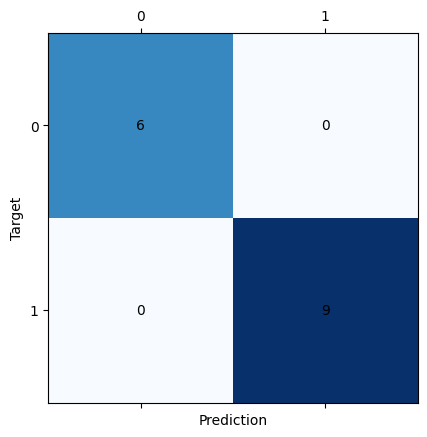

In [218]:
"""
Below, plot and display the confusion matrix of your prediction with respect to
true values. Use provided functions for plotting.
"""

#begin_solution
test = np.copy(Y_iris_test)
test[test > 0] = 1
plot_confusion_matrix(test, predicted_vals)
#end_solution


Do not write anything in the cell below, it is for the TAs

In [ ]:
#begin_test


#end_test



**Question 3b**
<a name='question3b'></a>

Implement Linear, multi-class classifier and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [212]:
def softmax(preds):
  """
  Write your implementation of the softmax activation here.

  Arguments:
  preds : The output predicted classes from your classifier

  Returns:
  activation : The outputs after applying softmax activation
  """

  #begin_solution
  e_x = np.exp(preds)
  activation = e_x / e_x.sum()
  #end_solution


  return activation

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [213]:
def lclass_prob(examplesA, examplesB, testExample):
    """
    Write your implementation of lclass_prob here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted probabilities of samples in testExample belonging to a class.
    """

    #begin_solution
    x = np.vstack((examplesA,examplesB))
    x = np.c_[np.ones(x.shape[0]),x]
    y = np.concatenate((np.zeros(len(examplesA)), np.ones(len(examplesB))))
    theta = nsolve(x,y)
    preds = (np.c_[np.ones(testExample.shape[0]), testExample] @ theta)
    #end_solution


    return preds

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [214]:
def lmclass(examples, labels, testExample):
    """
    Write your implementation of multiclass classifier lmclass here.
    Use your lclass_prob implementation here to solve this.

    Arguments:
    examples : The training data matrix
    labels : The training labels
    testExample : The testing data matrix

    Returns:
    preds_prob : For each sample in testExample, their predicted probabilities
                 of belonging to each class
    """

    #begin_solution
    preds_prob = []

    for label in np.unique(labels):
        a = examples[labels == label]
        b = examples[labels != label]
        prob = lclass_prob(a, b, testExample)
        preds_prob.append(1-prob)

    preds_prob = np.apply_along_axis(softmax, axis=1, arr=np.column_stack(preds_prob))
    #end_solution


    return preds_prob

Print the accuracy of the prediction below

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [219]:
#begin_solution
multiclass_pred = lmclass(X_iris,Y_iris,X_iris_test)
predicted_labels = np.argmax(multiclass_pred, axis=1)  # Get the predicted class labels
correct_predictions = np.sum(Y_iris_test == predicted_labels)
total_predictions = len(Y_iris_test)
accuracy = correct_predictions / total_predictions * 100
print(accuracy)
#end_solution


86.66666666666667


Do not write anything in the cell below, it is for the TAs

In [ ]:
#begin_test


#end_test



## 4. Denoising (30 points)
<a name='question4'></a>

[a)](#question4a) Implement `denoiseGauss(image)` to denoise the image `noisy_image.png` under `cw_datasets/Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question4b) Implement a convolutional neural network in Pytorch to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `cw_datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The network should have sufficient depth and complexity to be able to converge well.  Please use ReLU non-linearities after each layer (**20 points**).

[c)](#question4c) Given the comparison between the Gaussian-kernel denoising and the neural network denoising
methods, discuss which method performs better and why. You should write no more than 5 sentences. (**5 points**)


**Question 4a**
<a name='question4a'></a>

Implement the below functions to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [221]:
def gkern(l=5, sig=1.):

    #begin_solution
    ax = np.arange(-l // 2 + 1., l // 2 + 1.)
    x, y = np.meshgrid(ax, ax)
    # Apply gaussian formula
    out_kernel = np.exp(-(x ** 2 + y ** 2) / (2. * sig ** 2))
    # Normalise the result
    out_kernel = out_kernel / np.sum(out_kernel)
    #end_solution


    return out_kernel

def denoise_gauss(image):

    #begin_solution
    def convolve(image):
      image_height, image_width = image.shape
      kernel = gkern()
      kernel_height, kernel_width = kernel.shape
      output = np.zeros_like(image)

      pad_top = kernel_height // 2
      pad_bottom = kernel_height - pad_top - 1
      pad_left = kernel_width // 2
      pad_right = kernel_width - pad_left - 1

      padded_image = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='reflect')
      y_strides = padded_image.shape[1] - kernel_height + 1
      x_strides = padded_image.shape[0] - kernel_width + 1

      for i in range(y_strides):
          for j in range(x_strides):
              sub_matrix = padded_image[i:i+kernel_height, j:j+kernel_width]

              output[i, j] = np.sum(sub_matrix * kernel)

      return output

    if len(image.shape) == 3:
        r = convolve(image[:, :, 0])
        g = convolve(image[:, :, 1])
        b = convolve(image[:, :, 2])
        denoised_image = np.dstack((r, g, b))
    else:
        denoised_image = convolve(image)

    #end_solution


    return denoised_image

Load input image from file

In [222]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

noisy_image_filename = os.path.join(dataset_path,"Filtering/noisy_image.png")

Filter the input image

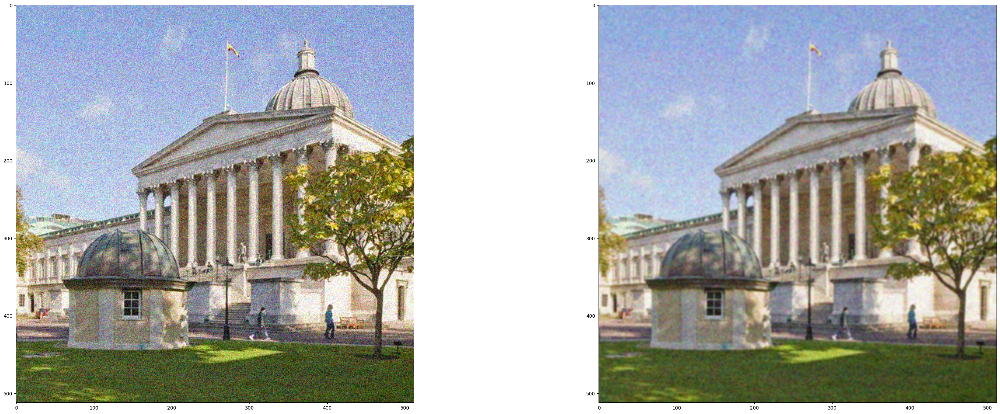

In [223]:
noisy_image = np.asarray(Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 4b**
<a name='question4b'></a>

Implement a neural denoiser using Pytorch

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
class DenoisingDB(Dataset):

    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()

        #begin_solution
        self.input_imgs_path = input_imgs_path
        self.cleaned_imgs_path = cleaned_imgs_path
        # List the filenames of the images in the specified directories
        self.input_names = os.listdir(input_imgs_path)
        self.cleaned_names = os.listdir(cleaned_imgs_path)
        #end_solution


    def __len__(self):
        #begin_solution
        length = len(self.input_names)
        #end_solution

        return length

    def __getitem__(self, idx):

        #begin_solution

        input_img = Image.open(os.path.join(self.input_imgs_path, self.input_names[idx]))
        width, height = input_img.size
        cropped_input_image = input_img.crop((0, 0, min(width, 128), min(height, 128))).resize((128,128))
        input_img = torch.from_numpy(np.array(cropped_input_image).astype(np.float32) / 255)

        cleaned_img = Image.open(os.path.join(self.cleaned_imgs_path, self.cleaned_names[idx]))
        cropped_cleaned_image = cleaned_img.crop((0, 0, min(width, 128), min(height, 128))).resize((128,128))
        cleaned_img = torch.from_numpy(np.array(cropped_cleaned_image).astype(np.float32) / 255)

        #end_solution


        return (input_img, cleaned_img)


Implement the Denoising network:

Note that the network need to be sufficiently complex for performing the denoising task successfully. Feel free to experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [224]:
class DenoisingCNN(nn.Module):
    def __init__(self):
        super(DenoisingCNN, self).__init__()

        #begin_solution
        # Encoder layers with added batch normalization and dropout
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1, padding_mode="replicate"),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.25),  # dropout after pooling
            nn.Conv2d(128, 256, kernel_size=3, padding=2, dilation=2),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(256),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.25),  # dropout after pooling
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

        # Decoder with added batch normalization
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 128, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(128),
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 1, kernel_size=3, padding=2, dilation=2, padding_mode="replicate"),
            nn.Sigmoid()  # to ensure the output is a valid grayscale image
        )
        #end_solution


    def forward(self, x):

        #begin_solution
        x = self.encoder(x)
        x = self.bottleneck(x)
        x = self.decoder(x)
        #end_solution


        return x

# Create an instance of the network
model = DenoisingCNN()


Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [225]:
def loss_function(prediction, target):
    """
    Calculate the Mean Squared Error (MSE) loss between the prediction and the target.

    Arguments:
    prediction : torch.Tensor
        The predicted image.
    target : torch.Tensor
        The target image for reconstruction.

    Returns:
    loss : torch.Tensor
        The computed loss.
    """

    #begin_solution
    criterion = nn.MSELoss()
    loss = criterion(prediction, target)
    #end_solution


    return loss


Paths to input data

In [226]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

input_imgs_path = os.path.join(dataset_path,"Denoising/input_noisy_images/")
cleaned_imgs_path = os.path.join(dataset_path,"Denoising/target_clean_images/")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [239]:
#begin_solution
db = DenoisingDB(input_imgs_path,cleaned_imgs_path)
device = "cuda" if torch.cuda.is_available() else "cpu"

# training parameters
n_epochs = 55
batch_size = 8
learning_rate = 0.001
train_ratio = 0.9

optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# getting and splitting the training data
indices = list(range(len(db)))
random.shuffle(indices)
split_idx = int(len(db) * train_ratio)
train_indices = indices[:split_idx]
test_indices = indices[split_idx:]
train_data = [db[i] for i in train_indices]
test_data = [db[i] for i in test_indices]

train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size)

model.to(device)
model.train()

for epoch in range(n_epochs):
    total_loss = 0.0
    # take every pair of images from the training data loader for training
    for input_img, cleaned_img in train_loader:
        optimizer.zero_grad()
        predicted_img = model(input_img.to(device).unsqueeze(1))
        loss = loss_function(predicted_img, cleaned_img.to(device).unsqueeze(1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch [{epoch + 1}/{n_epochs}] --> Loss: {total_loss / len(train_loader)}")

print("Training finished.")

denoiser = model

#end_solution





Epoch [1/55] --> Loss: 0.00811613627764232
Epoch [2/55] --> Loss: 0.004510357072029044
Epoch [3/55] --> Loss: 0.0038752925500054568
Epoch [4/55] --> Loss: 0.00359903704648947
Epoch [5/55] --> Loss: 0.003298988812329138
Epoch [6/55] --> Loss: 0.003275981282486635
Epoch [7/55] --> Loss: 0.003001449684448102
Epoch [8/55] --> Loss: 0.002963100792840123
Epoch [9/55] --> Loss: 0.0028425795026123524
Epoch [10/55] --> Loss: 0.0024799007292398635
Epoch [11/55] --> Loss: 0.0024040011031662718
Epoch [12/55] --> Loss: 0.0023782801650026266
Epoch [13/55] --> Loss: 0.00229411683154895
Epoch [14/55] --> Loss: 0.0022404542918700505
Epoch [15/55] --> Loss: 0.0021027916056268357
Epoch [16/55] --> Loss: 0.0019929275012520306
Epoch [17/55] --> Loss: 0.0020053223158945054
Epoch [18/55] --> Loss: 0.002427748329115703
Epoch [19/55] --> Loss: 0.001983974122113603
Epoch [20/55] --> Loss: 0.0018615712589748641
Epoch [21/55] --> Loss: 0.0017469656955012504
Epoch [22/55] --> Loss: 0.0017642946160562774
Epoch [23/

Save the model (needed for marking)

In [240]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"denoiser":denoiser}, "models/denoiser.pth")

Load trained model

In [241]:
state_dict = torch.load("models/denoiser.pth")
denoiser = state_dict["denoiser"].to(device)

Plot 5 input images and their relative denoised images side by side. Populate the 3 lists of input, gt and output with 5 images each.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

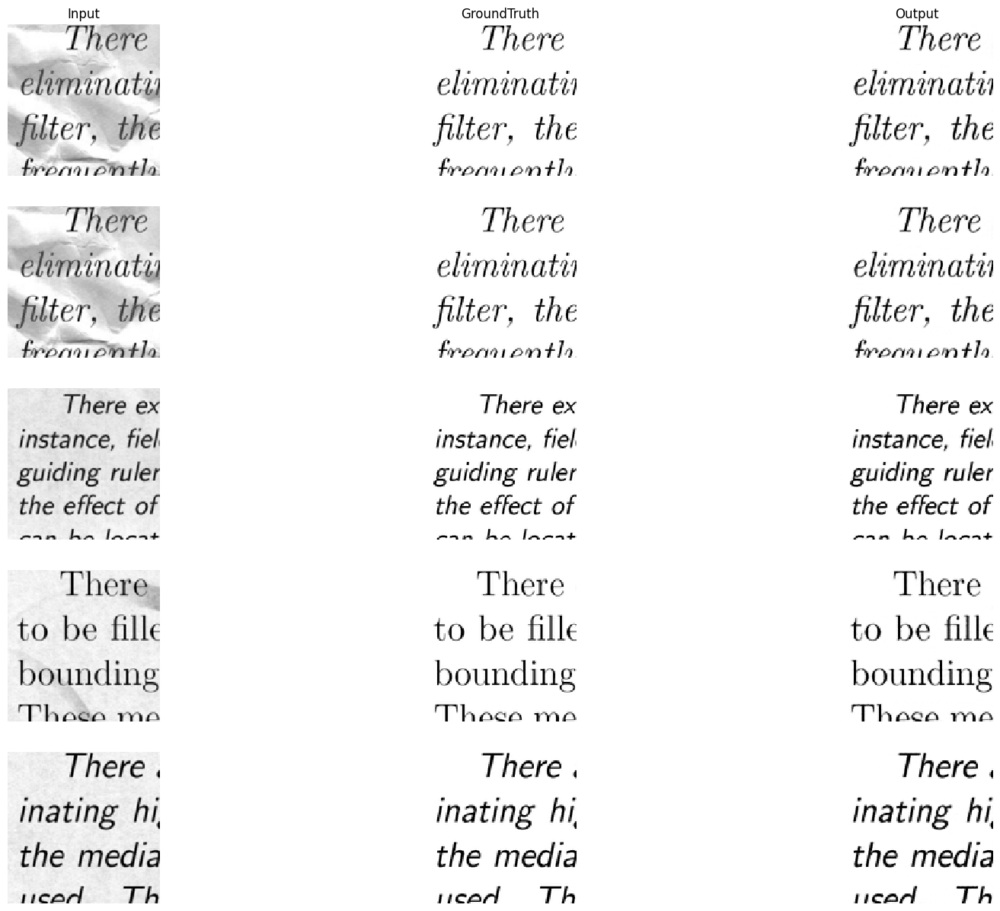

In [242]:
input_imgs, gt_imgs, output_imgs = [], [], []

#begin_solution
model.eval()

for input_img, gt_img in random.choices(test_data, k=5):
    input_imgs.append(input_img.detach().numpy())
    gt_imgs.append(gt_img.detach().numpy())

    with torch.no_grad():
      output_img = model(input_img.unsqueeze(0).unsqueeze(0).to(device))

    output_imgs.append(output_img.cpu().squeeze(0).squeeze(0).detach().numpy())
#end_solution


titles = ['Input', 'GroundTruth', 'Output']
plot_images_with_text([input_imgs, gt_imgs, output_imgs],titles,texts=None)


Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [243]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [dataset[i][0].to(device) for i in range(5)]
targets = [dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

#begin_solution
for i in images:
    with torch.no_grad():
      images_ae.append(model(i.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0).cpu().detach().numpy())
    images_gauss.append(denoise_gauss(i.cpu().detach().numpy()))
#end_solution


Now we plot images and PSNR, to compare the two methods

In [244]:
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]

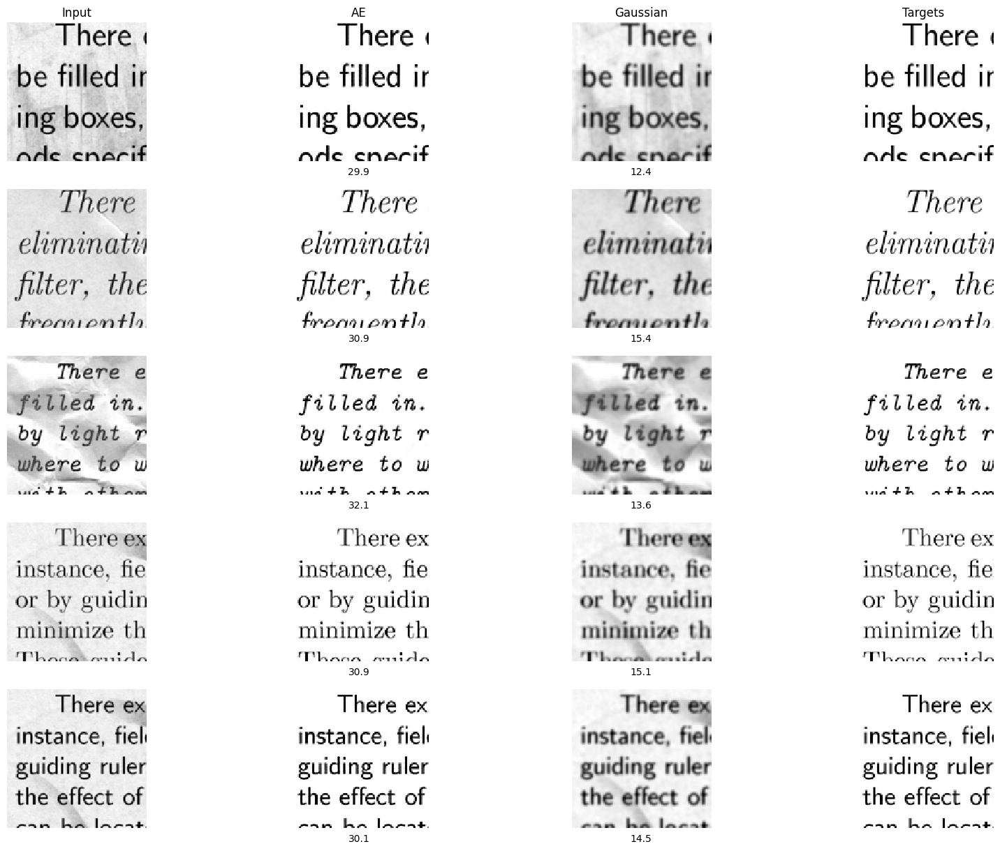

In [245]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images_with_text(img, titles, texts)
plt.show()

**Question 4c**
<a name="question4c"></a>

#### Discuss which method performs better, and why, edit the cell below with "Your reply" ####

_Your reply here:_ Concerning denoising, it has been found that CNN gave better results when compared to Gaussian filter by comparing PSNR values where high values were correspondingly linked with lower MSE. One of the key outstanding features differentiating the Gaussian filter-denoised images from those corrected via CNN is their sharpness and uniform background respectively. Otherwise, the blurriness of the former was coupled with a noisier background. However, the Gaussian filter possessed advantages such as speed, no need for training and simple implementation whereas CNN worked very well in noise removal process.


## 5. Implicit Neural Representation (30 points)
The objective here is to learn an implicit neural function to predict frames of an animated 2D object. That is, learn a function $f(x,y,t; \theta)$, where $\theta$ are learnable MLP weights, that takes as input pixel coordinates $x,y$ and time $t$ and predicts the pixel value at that location and time. The learned function should then be able to generate frames of the video at any given instance $t$. The task is divided into multiple incremental blocks as below:

[a)](#question5a) Fit an MLP model to a _single_ image. **(5 points)**

[b)](#question5b) Add positional encoding of pixels to improve prediction. **(5 points)**

[c)](#question5c) Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. **(8 points)**

[d)](#question5d) Fit the MLP to the sequence of frames with and without positional encoding on time, and report the result for both **(2 points)**

[e)](#question5e) Implement batching, to prevent memory issues when evaluating large number of pixels with the MLP. Size of a batch should not exceed 16000 **(5 points)**

[f)](#question5f) Generate a video of 100 frames uniformly sampled between the first and last frame. Since you trained on only 11 frames, by generating 100 frames you're interpolating unseen video frames. If your method works correctly, it should produce a continuous motion. If you overfit on the training frames, then it would give a discontinuous or jagged motion **(5 points)**


**Let's Prepare the animation inputs**

In [234]:
!wget 'https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif'

X = np.zeros((11,230,340),dtype=np.uint8)
with imageio.get_reader('The_Horse_in_Motion-anim.gif') as r:
    for i in range(11):
        X[i] = r.get_data(i)
        X[i,0:20] = 255
        X[i,200:] = 255
        X[i,:,300:] = 255
        X[i,:,:10] = 255

X_resized = np.stack([cv2.resize(X[k], (128,128), cv2.INTER_AREA) for k in range(X.shape[0])], axis=0)
for i in range(X_resized.shape[0]):
  X_resized[i] = np.where(X_resized[i]>60,0,1)

--2023-11-13 15:30:58--  https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 648978 (634K) [image/gif]
Saving to: ‘The_Horse_in_Motion-anim.gif.1’

The_Horse_in_Motion 100%[===================>] 633.77K  3.67MB/s    in 0.2s    

2023-11-13 15:30:59 (3.67 MB/s) - ‘The_Horse_in_Motion-anim.gif.1’ saved [648978/648978]



Let's visualize the frames:

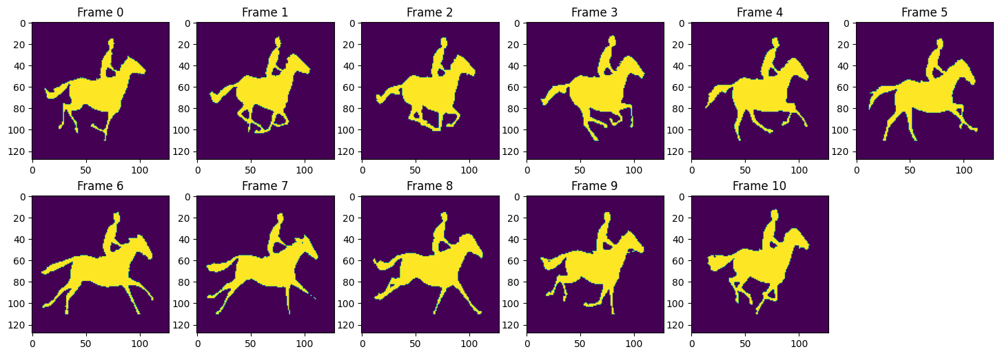

In [235]:
plt.figure(figsize=(6*3,2*3))
for i in range(11):
    plt.subplot(2,6,i+1)
    plt.imshow(X_resized[i])
    plt.title(f'Frame {i}')
plt.show()
plt.close()

Save the frames as a video sequence

In [236]:
output_path = 'input_bw_video.mp4'
with imageio.get_writer(output_path, mode='I', fps=10) as writer:
        for k in range(X_resized.shape[0]):
            writer.append_data(255*X_resized[k])
Video(output_path)

Visualization util method

In [237]:
def plot_implicit_representation_single_image(image, model, device='cuda'):

    '''
    Visualize implicit representation of image from training the MLP model

    Args:
        - image TORCHFLOAT32 (H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_image(image, model, device='cuda')
    U = U.reshape((1,image.shape[0],image.shape[1]))
    U_bw = (U>0.5).type(torch.int32).cpu()

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.title('Implicit rep.')
    plt.imshow(U[0].cpu().numpy())
    plt.colorbar()
    plt.clim(0,1)

    plt.subplot(1,3,2)
    plt.imshow(U_bw[0].cpu().numpy())
    plt.title('Prediction')

    plt.subplot(1,3,3)
    plt.imshow(image.cpu())
    plt.title('Ground truth')

def plot_implicit_representation_multi_images(images, model, device='cuda'):

    '''
    Visualize implicit representation of a set of images from training the MLP model

    Args:
        - images TORCHFLOAT32 (N,H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_images(images, model, device='cuda')
    U = U.reshape((images.shape[0],images.shape[1],images.shape[2])).cpu()
    U_bw = (U>0.5).type(torch.int32).cpu()

    for i in range(images.shape[0]):

        plt.figure(figsize=(12,6))

        plt.subplot(1,3,1)
        plt.title('Implicit rep.')
        plt.imshow(U[i].cpu().numpy())
        plt.colorbar()
        plt.clim(0,1)

        plt.subplot(1,3,2)
        plt.imshow(U_bw[i].cpu().numpy())
        plt.title('Prediction')

        plt.subplot(1,3,3)
        plt.imshow(images[i].cpu())
        plt.title(f'Ground truth Frame {i}')

def plot_loss_and_accuracy(loss_list,accuracy_list):
    plt.figure(figsize=(8*2,6))

    plt.subplot(1,2,1)
    plt.plot([x[0] for x in loss_list], [x[1] for x in loss_list])
    plt.title('Training loss')
    plt.xlabel('epochs')

    plt.subplot(1,2,2)
    plt.plot([x[0] for x in accuracy_list], [x[1] for x in accuracy_list])
    plt.title('Accuracy')
    plt.ylim(0.,1.)
    plt.xlabel('epochs')

**Question 5a**
<a name='question5a'></a>

Fit an MLP model to a single image

Below, write a MLP model which takes as input a pixel position (x,y) and return a pixel value prediction $p_{x,y}$

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [246]:
class MLP(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension):
        super(MLP, self).__init__()

        #begin_solution
        layers = []
        in_features = input_dimension

        for i in range(nb_layers):
            layers.append(nn.Linear(in_features, embedding_dimension))
            layers.append(nn.ReLU())
            in_features = embedding_dimension

        layers.append(nn.Linear(embedding_dimension, output_dimension))
        layers.append(nn.Sigmoid())

        self.mlp = nn.Sequential(*layers)

        #end_solution


    def forward(self, input):
        #begin_solution

        # ensure input is converted to float before passing into MLP
        prediction = self.mlp(input.to(torch.float32))

        #end_solution

        return prediction

Write a function which samples random pixel positions in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [247]:
## Sample random pixel positions
def sample_image(image, n, scaled=True):
  '''
  Args:
    - image TORCHINT32 (H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,2)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution
  H, W = image.shape

  # Generate random indices for sampling
  rand_indices = torch.randint(0, H * W, (n,))

  # Convert indices to 2D positions
  sampled_positions = torch.stack([rand_indices // W, rand_indices % W], dim=1).float()

  # if scaled:
  #     sampled_positions /= torch.tensor([H, W], dtype=torch.float32)

  # Gather pixel values at sampled positions
  pixel_values = image[sampled_positions.int()[:, 0], sampled_positions.int()[:, 1]]

  #end_solution


  return sampled_positions, pixel_values

Write a function that takes and image and a trained MLP and predicts all pixel values of the image. That is, for every $x,y$ in the given image, predict its pixel value with the MLP.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
def predict_image(image, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - prediction TORCHFLOAT32 (H, W) [CPU]
  '''
  #begin_solution
  image = image.float().to(device)
  H, W = image.shape

  # all pixel positions based on image shape
  positions = torch.stack(torch.meshgrid(torch.arange(0, H), torch.arange(0, W)), dim=-1).view(-1, 2).float().to(device)

  # if scale:
  #     positions /= torch.tensor([H, W], dtype=torch.float32).to(device)

  with torch.no_grad():
    prediction = model(positions).view(128, 128).cpu()

  # #end_solution


  return prediction

Write a function to evaluate the model's prediction performance

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [248]:
## Compute accuracy over the set of frames
def eval_accuracy(image, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - mean_accuracy FLOAT32
  '''

  #begin_solution
  model.eval()
  total_accuracy = 0

  predicted = predict_image(image, model, device=device)
  rounded_predictions = torch.round(predicted).int().to(device)

  correct_pixels = torch.sum(rounded_predictions == image.int().to(device)).item()

  accuracy = correct_pixels / torch.numel(image)

  #end_solution


  return accuracy

Write the training loop. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [252]:
loss_list, accuracy_list = [], []

#begin_solution
device = "cuda"

input_size = 2
layers = 8
hidden_size = 86
output_size = 1
model = MLP(input_size, layers, hidden_size, output_size)
model.to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

image = torch.tensor(X_resized[5], dtype=torch.float32)
H, W = image.shape

epochs = 3000
samples = 5000
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    sampled_image_positions, sampled_image_values = sample_image(image, samples, False)

    prediction = model(sampled_image_positions.to(device))
    loss = criterion(prediction.squeeze(), torch.tensor(sampled_image_values, dtype=torch.float32, device=device))
    loss.backward()
    optimizer.step()

    loss_list.append([epoch, loss.item()])
    acc = eval_accuracy(torch.tensor(image, dtype=torch.int32), model, device)
    accuracy_list.append([epoch, acc])

    print(f'Epoch {epoch + 1}/{epochs} --> Loss: {loss.item():.4f}, Accuracy: {acc}')

#end_solution


<ipython-input-252-9e0ba5d4dcc5>:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  loss = criterion(prediction.squeeze(), torch.tensor(sampled_image_values, dtype=torch.float32, device=device))
<ipython-input-252-9e0ba5d4dcc5>:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  acc = eval_accuracy(torch.tensor(image, dtype=torch.int32), model, device)


Epoch 1/3000 --> Loss: 0.7233, Accuracy: 0.61627197265625
Epoch 2/3000 --> Loss: 0.6888, Accuracy: 0.76263427734375
Epoch 3/3000 --> Loss: 0.6516, Accuracy: 0.8143310546875
Epoch 4/3000 --> Loss: 0.6095, Accuracy: 0.82696533203125
Epoch 5/3000 --> Loss: 0.5602, Accuracy: 0.83026123046875
Epoch 6/3000 --> Loss: 0.5049, Accuracy: 0.8311767578125
Epoch 7/3000 --> Loss: 0.4816, Accuracy: 0.83123779296875
Epoch 8/3000 --> Loss: 0.4764, Accuracy: 0.83123779296875
Epoch 9/3000 --> Loss: 0.5039, Accuracy: 0.83123779296875
Epoch 10/3000 --> Loss: 0.5162, Accuracy: 0.83123779296875
Epoch 11/3000 --> Loss: 0.5025, Accuracy: 0.83123779296875
Epoch 12/3000 --> Loss: 0.4779, Accuracy: 0.83123779296875
Epoch 13/3000 --> Loss: 0.4579, Accuracy: 0.83123779296875
Epoch 14/3000 --> Loss: 0.4559, Accuracy: 0.83123779296875
Epoch 15/3000 --> Loss: 0.4621, Accuracy: 0.83123779296875
Epoch 16/3000 --> Loss: 0.4604, Accuracy: 0.83123779296875
Epoch 17/3000 --> Loss: 0.4622, Accuracy: 0.83123779296875
Epoch 18

Save the model (needed for marking)

In [253]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image.pth")

Load the trained model

In [254]:
state_dict = torch.load("models/implicit_single_image.pth")
model = state_dict["model"].to(device)

Let's plot our performance

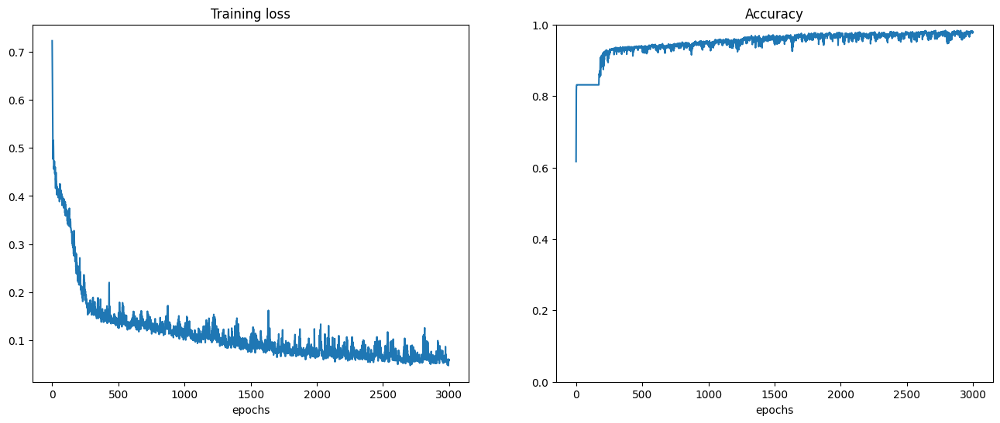

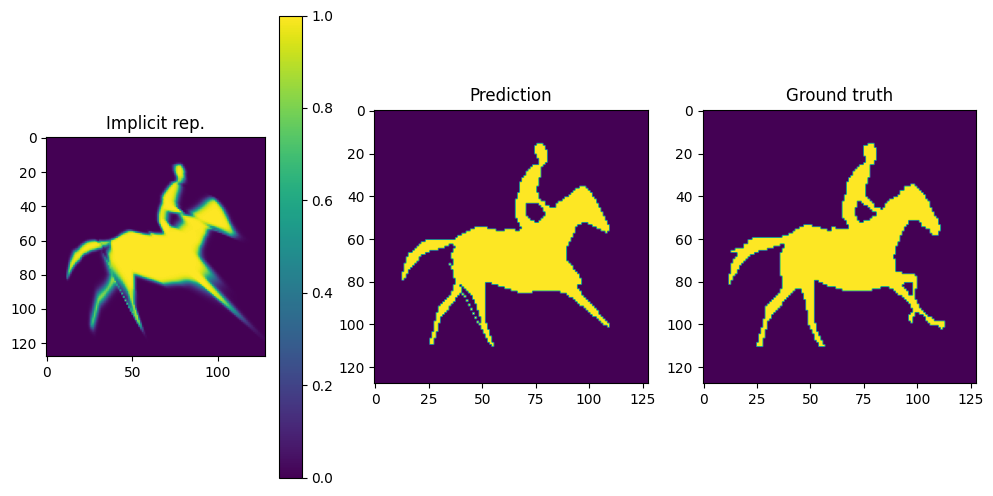

In [255]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device='cuda')

**Question 5b**
<a name='question5b'></a>

Add positional encoding of pixels to improve predictions.

Write a function that positionally encodes the input.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [256]:
def positional_embedding_power_ls(X,L, cst=torch.pi):
    #begin_solution
    samples, dim = X.shape
    # handle 3 dimensions by ignoring the time dimension (1st in our case)
    if dim == 3: X = X[:, 1:]

    # create a matrix of coefficients, then apply sin to them to achieve the encoding
    coef = torch.zeros(samples, L)
    for power in range(L):
        coef[:, power] = 2 ** power * cst
    sin_encoding = torch.sin(X.unsqueeze(2) @ coef.unsqueeze(1).to(X.device)).view(samples,-1)
    cos_encoding = torch.cos(X.unsqueeze(2) @ coef.unsqueeze(1).to(X.device)).view(samples,-1)

    #end_solution

    return torch.cat([cos_encoding,sin_encoding], axis=-1)

Write a new MLP, while reusing the previous MLP model, that can predict using the positionally encoded pixel locations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [257]:
class MLP_PE(nn.Module):
    '''
    MLP with positional encoding class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension, positional_enc_L=0):
        super(MLP_PE, self).__init__()
        #begin_solution
        self.positional_enc_L = positional_enc_L
        self.mlp = MLP(input_dimension, nb_layers, embedding_dimension, output_dimension)
        #end_solution


    def forward(self, input):

        #begin_solution
        positional_encoding = positional_embedding_power_ls(input.to(torch.float32), self.positional_enc_L)
        input = torch.cat([input, positional_encoding], dim=1)

        prediction = self.mlp(input)
        #end_solution

        return prediction

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [258]:
loss_list, accuracy_list = [], []

#begin_solution
device = "cuda"
pos_power_ls = 32
input_size = (pos_power_ls * 4) + 2
layers = 8
hidden_size = 86
output_size = 1
learning_rate = 0.001

model = MLP_PE(input_size, layers, hidden_size, output_size, pos_power_ls).to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Select a single image to fit the model to
image = torch.tensor(X_resized[9], dtype=torch.float32)
H, W = image.shape

# Training loop for 1 iteration
epochs = 1500
samples = 4000
for epoch in range(epochs):
    # Forward pass
    model.train()
    optimizer.zero_grad()

    total_loss = 0

    sampled_image_positions, sampled_image_values = sample_image(image, samples, False)
    prediction = model(sampled_image_positions.to(device))
    loss = criterion(prediction.squeeze(), torch.tensor(sampled_image_values, dtype=torch.float32, device=device))
    loss.backward()
    optimizer.step()

    loss_list.append([epoch, loss.item()])
    acc = eval_accuracy(torch.tensor(image, dtype=torch.int32), model, device)
    accuracy_list.append([epoch, acc])
    print(f'Epoch {epoch + 1}/{epochs} -> Loss: {loss.item():.4f}, Accuracy : {acc}')

#end_solution


<ipython-input-258-3762bc3fe84d>:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  loss = criterion(prediction.squeeze(), torch.tensor(sampled_image_values, dtype=torch.float32, device=device))
<ipython-input-258-3762bc3fe84d>:38: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  acc = eval_accuracy(torch.tensor(image, dtype=torch.int32), model, device)


Epoch 1/1500 -> Loss: 0.6610, Accuracy : 0.84002685546875
Epoch 2/1500 -> Loss: 0.6549, Accuracy : 0.84002685546875
Epoch 3/1500 -> Loss: 0.6457, Accuracy : 0.84002685546875
Epoch 4/1500 -> Loss: 0.6373, Accuracy : 0.84002685546875
Epoch 5/1500 -> Loss: 0.6305, Accuracy : 0.84002685546875
Epoch 6/1500 -> Loss: 0.6155, Accuracy : 0.84002685546875
Epoch 7/1500 -> Loss: 0.5994, Accuracy : 0.84002685546875
Epoch 8/1500 -> Loss: 0.5801, Accuracy : 0.84002685546875
Epoch 9/1500 -> Loss: 0.5558, Accuracy : 0.84002685546875
Epoch 10/1500 -> Loss: 0.5293, Accuracy : 0.84002685546875
Epoch 11/1500 -> Loss: 0.4920, Accuracy : 0.84002685546875
Epoch 12/1500 -> Loss: 0.4528, Accuracy : 0.84002685546875
Epoch 13/1500 -> Loss: 0.4400, Accuracy : 0.84002685546875
Epoch 14/1500 -> Loss: 0.4782, Accuracy : 0.84002685546875
Epoch 15/1500 -> Loss: 0.4831, Accuracy : 0.84002685546875
Epoch 16/1500 -> Loss: 0.4903, Accuracy : 0.84002685546875
Epoch 17/1500 -> Loss: 0.4652, Accuracy : 0.84002685546875
Epoch 

Save the model (needed for marking)

In [259]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image_positional_encoding.pth")

Load the trained model

In [260]:
state_dict = torch.load("models/implicit_single_image_positional_encoding.pth")
model = state_dict["model"].to(device)

Let's plot our performance.

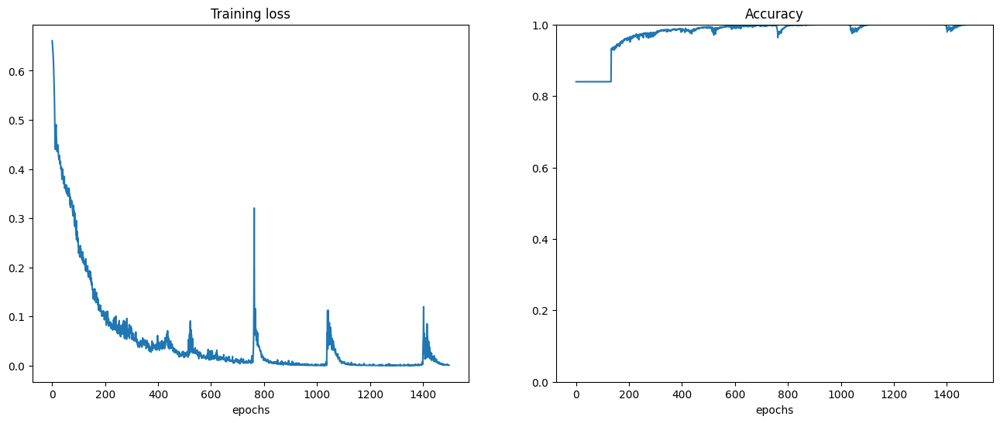

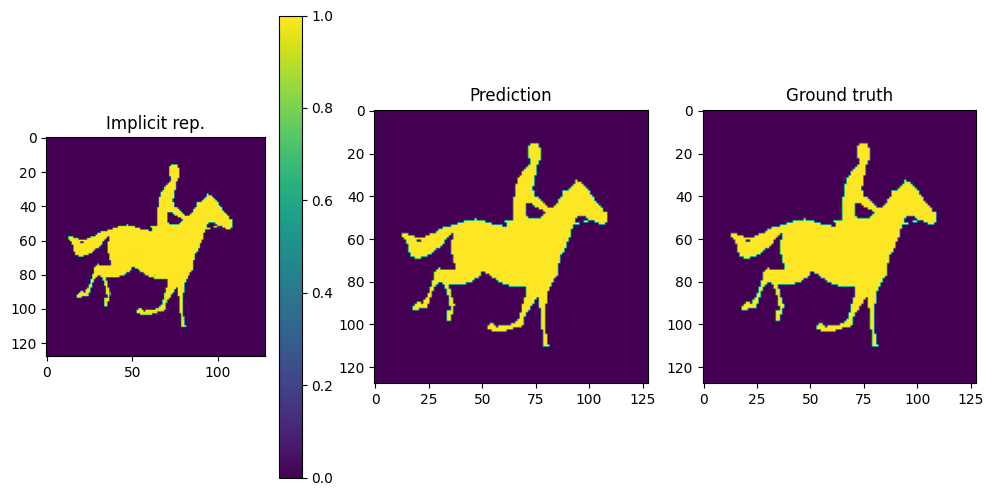

In [261]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device='cuda')

**Question 5c**
<a name='question5c'></a>

Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. You'd need to rewrite image sampling and other functions to achieve this.

Write a function that can now also sample across the time dimension.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [264]:
def sample_images(images, n, scaled=True):
  '''
  Args:
    - images TORCHINT32 (N_frames, H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,3)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution
  F, H, W = images.shape

  rand_indices = torch.randint(0, images.numel(), (n,))

  sampled_positions = torch.stack([
    rand_indices // (images.shape[1] * images.shape[2]),    # Along dimension H
    (rand_indices % (images.shape[1] * images.shape[2])) // images.shape[2],  # Along dimension W
    rand_indices % images.shape[2]  # Along dimension D
  ], dim=1).float()

  # If scaled is True, normalize positions by the image dimensions
  # if scaled:
  #     sampled_positions /= torch.tensor([H, W], dtype=torch.float32)

  # Get pixel values at sampled positions
  pixel_values = images[sampled_positions.int()[:, 0], sampled_positions.int()[:, 1], sampled_positions.int()[:, 2]]
  #end_solution

  return sampled_positions, pixel_values


Write a function to predict the images, now also across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [265]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  F, H, W = images.shape
  positions = torch.stack(torch.meshgrid(torch.arange(0, F), torch.arange(0, H), torch.arange(0, W)), dim=-1).view(-1, 3).float().to(device)
  prediction = model(positions).view(images.shape).cpu()

  # If scale is True, normalize positions by the image dimensions?
  # if scale:
  #     positions /= torch.tensor([H, W], dtype=torch.float32).to(device)
  #end_solution


  return prediction

Write a function to evaluate performance across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [266]:
## Compute accuracy over the set of frames
def eval_mean_accuracy(images, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - mean_accuracy FLOAT32
  '''
  #begin_solution

  # predict images and round the float values to 0 or 1 to compare with dataset
  predicted = torch.round(predict_images(images, model, device=device)).int().to(device)

  images = images.int().to(device)
  correct_pixels = torch.sum(predicted == images).item()

  # Calculate mean accuracy
  accuracy = correct_pixels / torch.numel(images)

  #end_solution


  return accuracy

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [269]:
loss_list, accuracy_list = [], []

#begin_solution
device = "cuda"
torch.cuda.empty_cache()

pos_power_ls = 86
input_size = (pos_power_ls * 4 ) + 3
layers = 14
hidden_size = 256
output_size = 1
learning_rate = 0.001

model = MLP_PE(input_size, layers, hidden_size, output_size, pos_power_ls)
model.to(device)

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

images = torch.tensor(X_resized, dtype=torch.float32)
F, H, W = images.shape

epochs = 1500
samples = 3000 * F
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()

    sampled_image_positions, sampled_image_values = sample_images(images, samples, False)
    sampled_image_values = sampled_image_values.type(dtype=torch.float32).to(device)

    prediction = model(sampled_image_positions.to(device))

    loss = criterion(prediction.squeeze(), sampled_image_values)
    loss.backward()
    optimizer.step()

    loss_list.append([epoch, loss.item()])
    acc = eval_mean_accuracy(torch.tensor(images, dtype=torch.int32), model, device)
    accuracy_list.append([epoch, acc])
    print(f'Epoch {epoch + 1}/{epochs} --> Loss: {loss.item():.4f}, Accuracy: {acc}')


#end_solution


<ipython-input-269-3a9421cedd0b>:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  acc = eval_mean_accuracy(torch.tensor(images, dtype=torch.int32), model, device)


Epoch 1/1500 --> Loss: 0.6941, Accuracy: 0.8401211825284091
Epoch 2/1500 --> Loss: 0.6814, Accuracy: 0.8401211825284091
Epoch 3/1500 --> Loss: 0.6700, Accuracy: 0.8401211825284091
Epoch 4/1500 --> Loss: 0.6588, Accuracy: 0.8401211825284091
Epoch 5/1500 --> Loss: 0.6461, Accuracy: 0.8401211825284091
Epoch 6/1500 --> Loss: 0.6292, Accuracy: 0.8401211825284091
Epoch 7/1500 --> Loss: 0.5981, Accuracy: 0.8401211825284091
Epoch 8/1500 --> Loss: 0.5335, Accuracy: 0.8401211825284091
Epoch 9/1500 --> Loss: 0.4487, Accuracy: 0.8401211825284091
Epoch 10/1500 --> Loss: 0.6996, Accuracy: 0.8401211825284091
Epoch 11/1500 --> Loss: 0.4911, Accuracy: 0.8401211825284091
Epoch 12/1500 --> Loss: 0.4475, Accuracy: 0.8401211825284091
Epoch 13/1500 --> Loss: 0.4888, Accuracy: 0.8401211825284091
Epoch 14/1500 --> Loss: 0.5134, Accuracy: 0.8401211825284091
Epoch 15/1500 --> Loss: 0.5254, Accuracy: 0.8401211825284091
Epoch 16/1500 --> Loss: 0.5274, Accuracy: 0.8401211825284091
Epoch 17/1500 --> Loss: 0.5236, A

Save the model (needed for marking)

In [270]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_images_sequence.pth")

Load the trained model

In [271]:
state_dict = torch.load("models/implicit_images_sequence.pth")
model = state_dict["model"].to(device)

Let's plot our performance

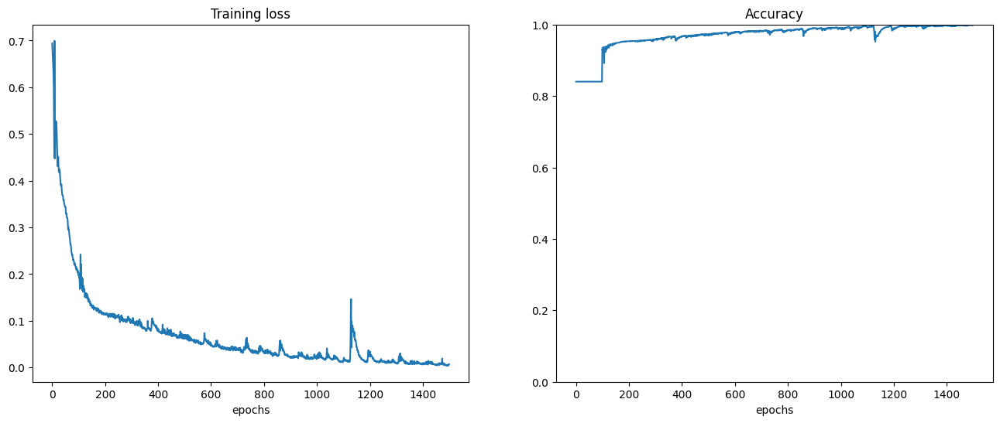

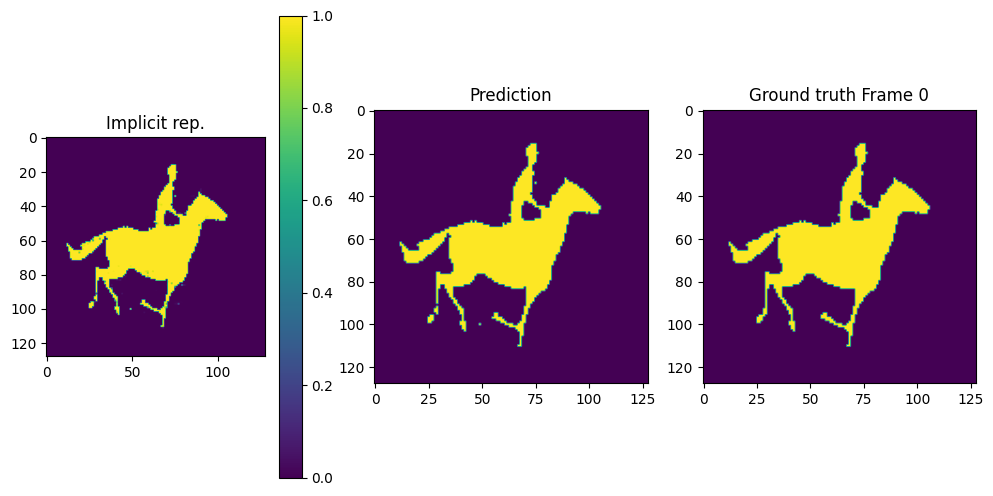

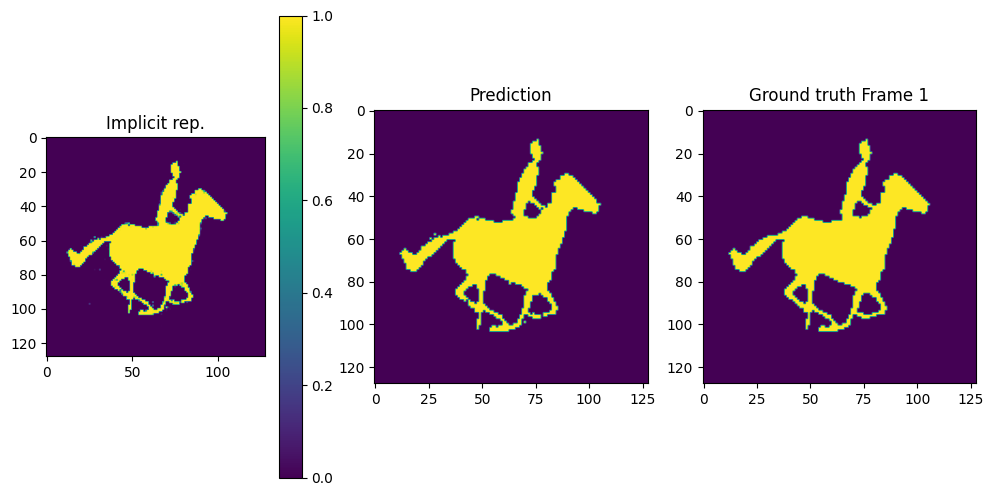

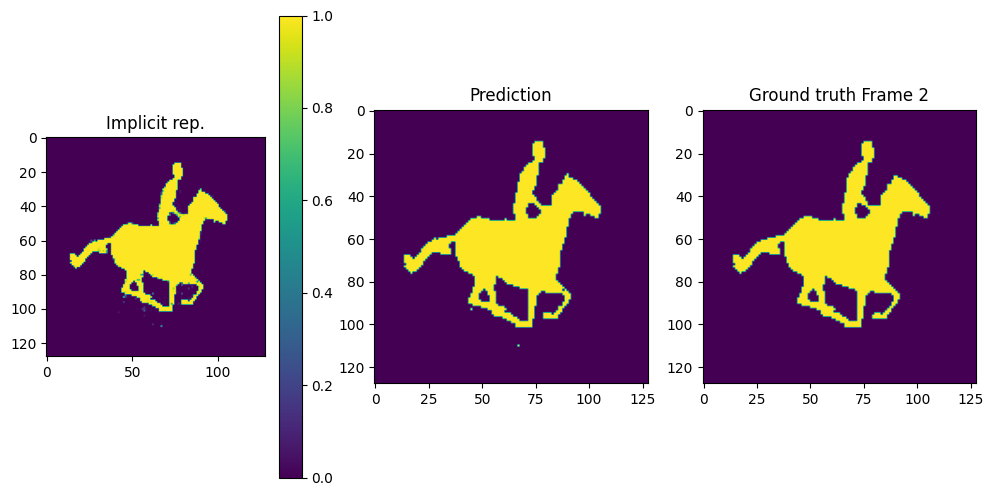

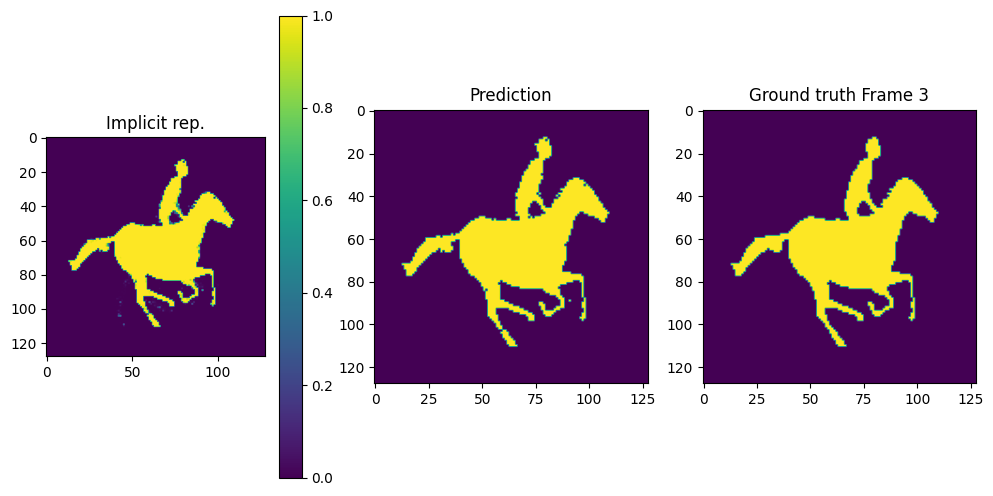

...

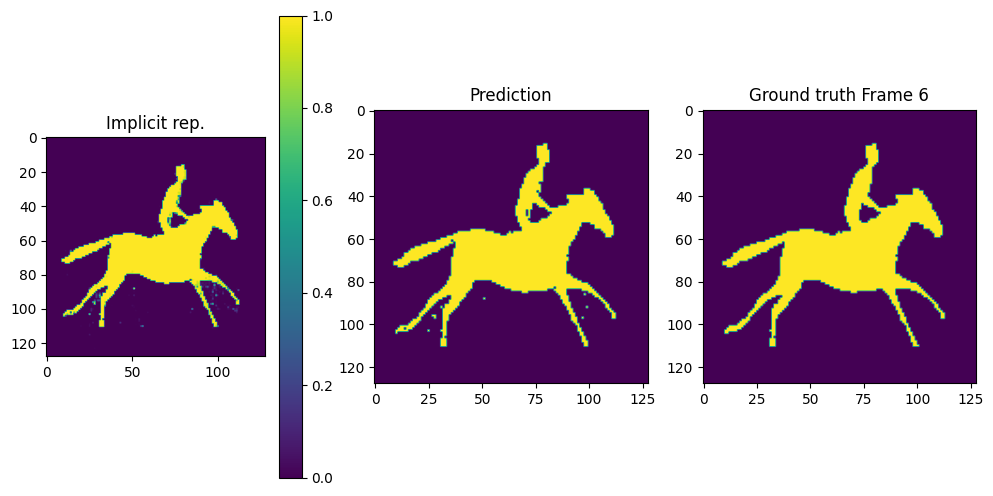

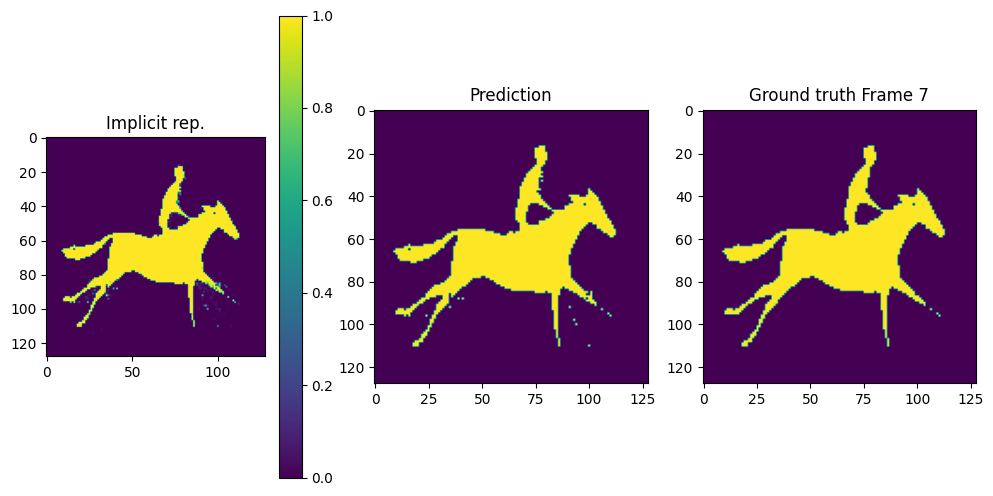

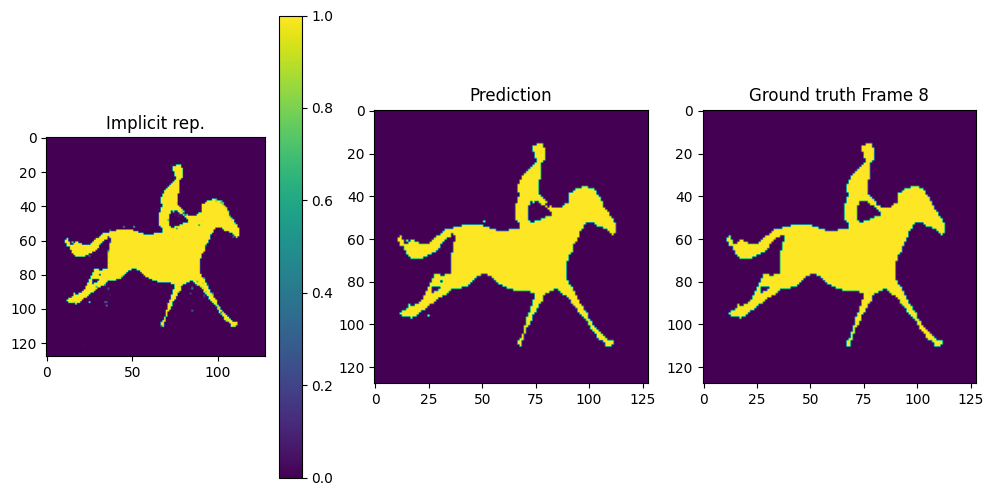

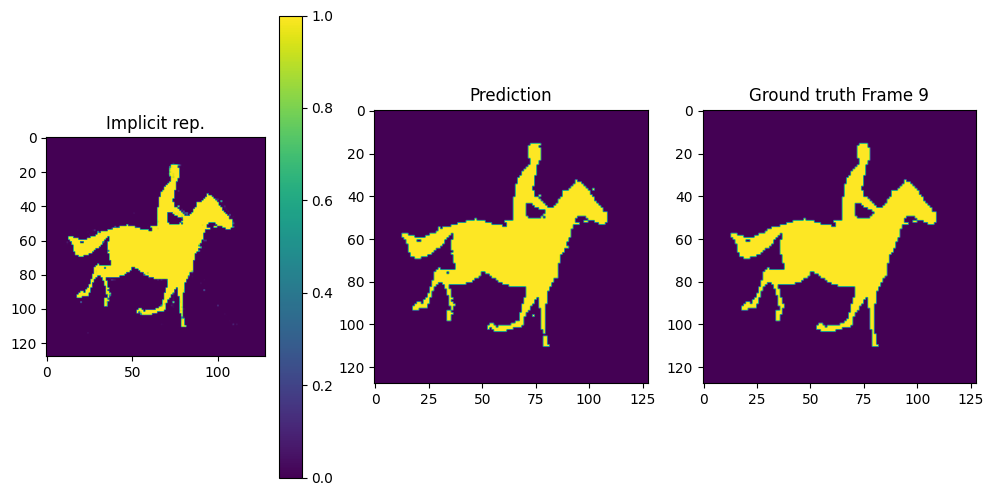

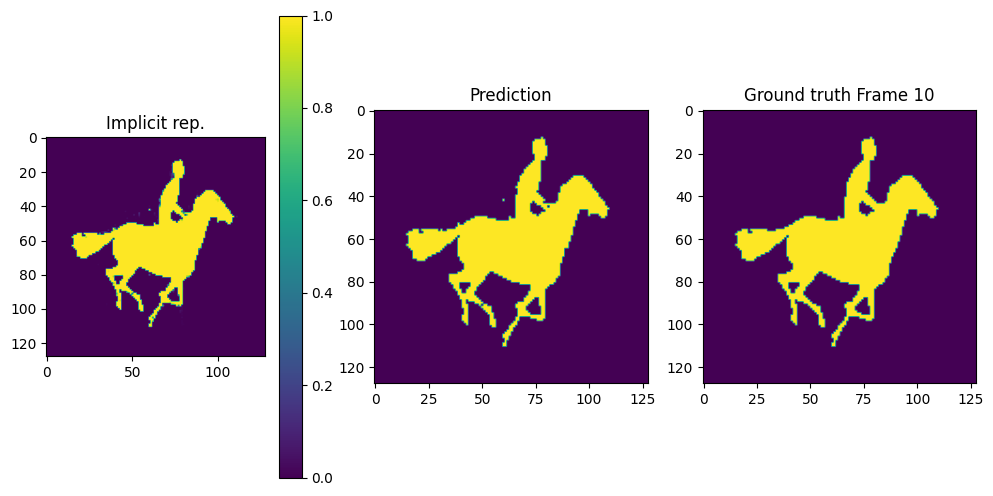

In [272]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_multi_images(images, model, device='cuda')

**Question 5d**
<a name='question5d'></a>

Apply positional encoding for the time dimension.

Write a function that positionally encodes time values, with an optional flag to enable or disable it.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [273]:
def positional_embedding_power_ls(X,L, cst=torch.pi, encode_time_dimension=True):
    #begin_solution
    samples, dim = X.shape
    # if we don't want to encode the time dimension, then ignore it by clipping it out
    if not encode_time_dimension: X = X[:, 1:]

    coef = torch.zeros(samples, L)
    for i in range(L):
        coef[:, i] = 2 ** i * cst
    sin_encoding = torch.sin(X.unsqueeze(2) @ coef.unsqueeze(1).to(X.device)).view(samples,-1)
    cos_encoding = torch.cos(X.unsqueeze(2) @ coef.unsqueeze(1).to(X.device)).view(samples,-1)

    encoding = torch.cat([cos_encoding,sin_encoding], axis=-1)
    #end_solution

    return encoding

Write a new MLP, while re-using the previous one, that now predicts using the positionally encoded time. It should also predict without positional encoding, for comparison.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [274]:
class MLP_PE_time_option(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension,
                 positional_enc_L=0,encode_time_dimension=True):
        super(MLP_PE_time_option, self).__init__()
        #begin_solution
        self.encode_time_dimension = encode_time_dimension
        self.positional_enc_L = positional_enc_L

        # self.mlp_pe = MLP_PE(input_dimension, nb_layers, embedding_dimension, output_dimension, positional_enc_L)

        layers = []
        in_features = input_dimension

        for _ in range(nb_layers):
            layers.append(nn.Linear(in_features, embedding_dimension))
            layers.append(nn.ReLU())
            layers.append(nn.BatchNorm1d(embedding_dimension))  # Batch Normalization
            layers.append(nn.Dropout(0.2))  # Dropout for regularization
            in_features = embedding_dimension

        layers.append(nn.Linear(embedding_dimension, output_dimension))
        layers.append(nn.Sigmoid())

        self.mlp_pe = nn.Sequential(*layers)
        #end_solution


    def forward(self, input):
        #begin_solution
        positional_encoding = positional_embedding_power_ls(input.to(torch.float32), self.positional_enc_L, encode_time_dimension=self.encode_time_dimension)
        input = torch.cat([input, positional_encoding], dim=-1)

        prediction = self.mlp_pe(input)
        #end_solution

        return prediction


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list. These lists can be used for plotting later.

Note that this time, the two lists are nested. Each list should contain two sub-lists, one with Positional Encoding turned ON and other with Positional Encoding turned oFF. Each sub-list, similar to before, has scalar loss/acurracy values in each epoch.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [275]:
loss_list, accuracy_list = [[],[]], [[],[]]


#begin_solution
device = "cuda"
torch.cuda.empty_cache()

pos_power_ls = 32
input_size_with_timeEnc = (pos_power_ls * 6) + 3
input_size_no_timeEnc = (pos_power_ls * 4) + 3
layers = 13
hidden_size = 550
output_size = 1
learning_rate = 0.0009

model_with_timeEnc = MLP_PE_time_option(input_size_with_timeEnc, layers, hidden_size, output_size, pos_power_ls, True).to(device)
criterion_with_timeEnc = nn.SmoothL1Loss()
optimizer_with_timeEnc = optim.Adam(model_with_timeEnc.parameters(), lr=learning_rate)


model_no_timeEnc = MLP_PE_time_option(input_size_no_timeEnc, layers, hidden_size, output_size, pos_power_ls, False).to(device)
criterion_no_timeEnc = nn.SmoothL1Loss()
optimizer_no_timeEnc = optim.Adam(model_no_timeEnc.parameters(), lr=learning_rate)

images = torch.tensor(X_resized, dtype=torch.float32)
F, H, W = images.shape

# Training loop for 1 iteration
epochs = 500
samples = 6500 * F
for epoch in range(epochs):
    # Forward pass
    torch.cuda.empty_cache()
    optimizer_with_timeEnc.zero_grad()

    sampled_image_positions, sampled_image_values = sample_images(images, samples, False)
    sampled_image_values = sampled_image_values.type(dtype=torch.float32).to(device)

    prediction_with_timeEnc = model_with_timeEnc(sampled_image_positions.to(device))
    loss_with_timeEnc = criterion_with_timeEnc(prediction_with_timeEnc.squeeze(), sampled_image_values)
    loss_with_timeEnc.backward()
    optimizer_with_timeEnc.step()

    loss_list[0].append([epoch, loss_with_timeEnc.item()])
    #accuracy_list[0].append([epoch, eval_accuracy(, model, device)])
    accuracy_list[0].append([epoch, 0])
    print(f'Epoch {epoch + 1}/{epochs} --> Loss With Time Encoding: {loss_with_timeEnc.item():.4f}')


for epoch in range(epochs):
    torch.cuda.empty_cache()
    optimizer_no_timeEnc.zero_grad()

    sampled_image_positions, sampled_image_values = sample_images(images, samples, False)
    sampled_image_values = sampled_image_values.type(dtype=torch.float32).to(device)

    prediction_no_timeEnc = model_no_timeEnc(sampled_image_positions.to(device))
    loss_no_timeEnc = criterion_no_timeEnc(prediction_no_timeEnc.squeeze(), sampled_image_values)
    loss_no_timeEnc.backward()
    optimizer_no_timeEnc.step()

    loss_list[1].append([epoch, loss_no_timeEnc.item()])
    accuracy_list[1].append([epoch, 0])

    print(f'Epoch {epoch + 1}/{epochs} --> Loss Without Time Encoding: {loss_no_timeEnc.item():.4f}')

mlp_model_with_time_encoding = model_with_timeEnc
mlp_model_without_time_encoding = model_no_timeEnc
#end_solution


Epoch 1/500 --> Loss With Time Encoding: 0.1351
Epoch 2/500 --> Loss With Time Encoding: 0.1404
Epoch 3/500 --> Loss With Time Encoding: 0.1100
Epoch 4/500 --> Loss With Time Encoding: 0.0934
Epoch 5/500 --> Loss With Time Encoding: 0.0703
Epoch 6/500 --> Loss With Time Encoding: 0.0548
Epoch 7/500 --> Loss With Time Encoding: 0.0489
Epoch 8/500 --> Loss With Time Encoding: 0.0406
Epoch 9/500 --> Loss With Time Encoding: 0.0395
Epoch 10/500 --> Loss With Time Encoding: 0.0376
Epoch 11/500 --> Loss With Time Encoding: 0.0355
Epoch 12/500 --> Loss With Time Encoding: 0.0334
Epoch 13/500 --> Loss With Time Encoding: 0.0327
Epoch 14/500 --> Loss With Time Encoding: 0.0320
Epoch 15/500 --> Loss With Time Encoding: 0.0307
Epoch 16/500 --> Loss With Time Encoding: 0.0301
Epoch 17/500 --> Loss With Time Encoding: 0.0297
Epoch 18/500 --> Loss With Time Encoding: 0.0297
Epoch 19/500 --> Loss With Time Encoding: 0.0282
Epoch 20/500 --> Loss With Time Encoding: 0.0281
Epoch 21/500 --> Loss With Ti

Save the model (needed for marking)

In [276]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":mlp_model_with_time_encoding}, "models/implicit_images_sequence_with_time_encoding.pth")
torch.save({"model":mlp_model_without_time_encoding}, "models/implicit_images_sequence_without_time_encoding.pth")

Let's plot both accuracies and loss curves.

Accuracy with time encoding : 0.000 without: 0.000


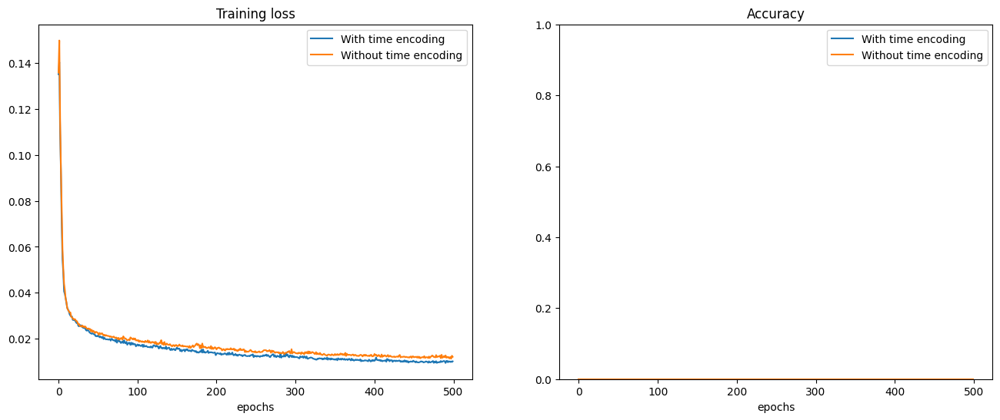

In [277]:
plt.figure(figsize=(8*2,6))

plt.subplot(1,2,1)
plt.plot([x[0] for x in loss_list[0]], [x[1] for x in loss_list[0]], label='With time encoding')
plt.plot([x[0] for x in loss_list[1]], [x[1] for x in loss_list[1]], label='Without time encoding')
plt.title('Training loss')
plt.legend()
plt.xlabel('epochs')

plt.subplot(1,2,2)
plt.plot([x[0] for x in accuracy_list[0]], [x[1] for x in accuracy_list[0]], label='With time encoding')
plt.plot([x[0] for x in accuracy_list[1]], [x[1] for x in accuracy_list[1]], label='Without time encoding')
plt.title('Accuracy')
plt.ylim(0.,1.)
plt.xlabel('epochs')
plt.legend()

print('Accuracy with time encoding : {:.3f} without: {:.3f}'.format(accuracy_list[0][-1][1],accuracy_list[1][-1][1]))

**Question 5e**
<a name='question5e'></a>

Implement batching to prevent memory issues when evaluating large number of pixels with the MLP. Batch size should not exceed 16000.

Write a partition indexing function to create a list of partition indices that can be used to split the input into equal size chunks for prediction

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [278]:
def partition_index(totalsize, chunksize):
    '''
    Args:
        - totalsize: int, Size of the batch to process
        - chunksize: int, subdivision to apply
    Return:
        - list_tuples: List, List of tuples (i,j) to process the batch in equal chunk
    '''
    #begin_solution
    num_chunks = totalsize // chunksize
    remainder = totalsize % chunksize

    list_tuples = []

    start = 0
    for i in range(num_chunks):
        end = start + chunksize
        list_tuples.append((start, end))
        start = end

    # Add the remaining elements as a separate chunk
    if remainder > 0:
        list_tuples.append((start, start + remainder))
    #end_solution

    return list_tuples

Update image prediction to use the implemented batch partitioning

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [279]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  images = images.float().to(device)# Generate pixel positions based on image dimensions# prediction = torch.tensor([], device=device)

  F, H, W = images.shape

  positions = torch.stack(torch.meshgrid(torch.linspace(1, 10, F, dtype=torch.float32), torch.arange(0, H, dtype=torch.float32), torch.arange(0, W,dtype=torch.float32)), dim=-1).view(-1, 3).float().to(device)
  indexes = partition_index(positions.shape[0], 5000)

  # [[[x1,y1], [x2,y2] ...],
  #  [x1,y1], [x2,y2] ...]]

  prediction = torch.tensor([], dtype=torch.float32, device=device)
  for a,b in indexes:
    positions_batch = positions[a:b]
    with torch.no_grad():
      pred = model(positions_batch)
      prediction = torch.cat([prediction, pred], 0)
    # print(prediction.shape)
  prediction = prediction.view(F,H,W).cpu()

  #end_solution


  return prediction


**Question 5f**
<a name='question5f'></a>

Write code to generate a video of 100 frames uniformly sampled between the first and last frame. Save the video as an MP4.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

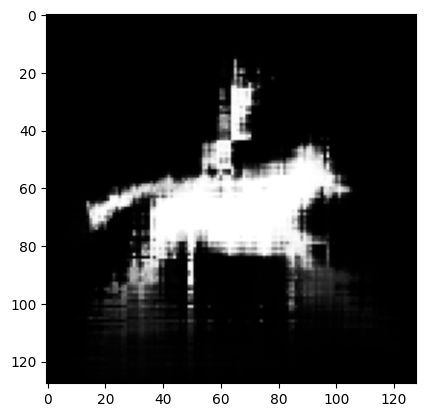

In [280]:
output_path = 'result_bw_video.mp4'
#begin_solution
device = "cuda"
torch.cuda.empty_cache()
# Create an instance of the MLP model
mlp_model_with_time_encoding.eval()


images = torch.zeros(100, 128, 128, dtype=torch.int32, device=device)
predictions = predict_images(images, mlp_model_with_time_encoding, device, False)

plt.imshow(predictions[2].numpy(), cmap="gray")

with imageio.get_writer(output_path, mode='I', fps=10) as writer:
        predictions = predictions.detach().numpy()
        for k in range(predictions.shape[0]):
            writer.append_data((255*predictions[k]).astype(np.uint8))

# end_solution

Video(output_path)